In [21]:
import torch
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import numpy as np
import pickle


In [22]:
# with open('data/reset_splines.pkl', 'rb') as f:
#     reset_splines = pickle.load(f)
# with open('data/set_splines.pkl', 'rb') as f:
#     set_splines = pickle.load(f)


with open('data\datav2_resetspline.pkl', 'rb') as f:
    reset_splines = pickle.load(f)
with open('data\datav2_setspline.pkl', 'rb') as f:
    set_splines = pickle.load(f)

In [23]:

# Initialize x with a random value and set requires_grad to True so PyTorch tracks its gradient
x = torch.tensor([1.5], requires_grad=True)  # starting point
learning_rate = 0.1
num_steps = 300  # Number of gradient descent steps



In [24]:
class HardwareAwareOptimizer(torch.optim.Optimizer):
    def __init__(self, params, lr=0.01, set_splines=None, reset_splines = None):
        defaults = dict(lr=lr)
        self.set_splines = set_splines
        self.reset_splines = reset_splines
        super(HardwareAwareOptimizer, self).__init__(params, defaults)

    def step(self):
        def map_weights_to_conductance(weight, min_weight, max_weight, min_conductance, max_conductance):
            # Linear interpolation from weight to conductance
            normalized_weights = (weight - min_weight) / (max_weight - min_weight)
            mapped_conductance = min_conductance + normalized_weights * (max_conductance - min_conductance)
            mapped_conductance = torch.clamp(mapped_conductance, min_conductance, max_conductance)
            return mapped_conductance
        
        def new_conductance(G0, grad):
            
            # G_pos = G0*1.05
            # G_neg = G0*(0.95)
            # Apply the splines based on gradient
            tau = 0.08
            # Masks for set, reset, and no change conditions
            set_mask = torch.ge(grad, tau)       # Apply set spline if grad >= tau
            reset_mask = torch.le(grad, -tau)    # Apply reset spline if grad <= -tau

            # Apply the set and reset splines
            # G_pos = G0 * self.reset_splines['1 us'].ev(G0, -1.85)    # Set spline adjustment
            # G_neg = G0 * self.set_splines['1 us'].ev(G0, 1.83) # Reset spline adjustment
            # G_pos = G0 * self.reset_splines(G0)
            # G_neg = G0 * self.set_splines(G0)

            G_neg = G0 +1.0410955555555556e-09
            G_pos = G0 -2.4080184210526313e-09

            # Use torch.where to select G_pos, G_neg, or G0 based on conditions
            G_new = torch.where(set_mask, G_pos, torch.where(reset_mask, G_neg, G0))

            return G_new
            # positive_mask = torch.le(grad, 0)  # Check for grad >= 0
            # G_pos = G0 * (self.set_splines['1 us'].ev(G0, 2.5))
            # G_neg = G0 * (self.reset_splines['1 us'].ev(G0, -2.5))
            
            # # # Combine both positive and negative cases
            # G_new = torch.where(positive_mask, G_pos, G_neg)
            # return G_new

        def map_conductance_to_weights(conductance, min_conductance, max_conductance, min_weight, max_weight):
            # Reverse mapping from conductance to weight

            normalized_conductance = (conductance - min_conductance) / (max_conductance - min_conductance)
            mapped_weight = min_weight + normalized_conductance * (max_weight - min_weight)
            mapped_weight = torch.clamp(mapped_weight, min_weight, max_weight)
            return mapped_weight

        def map_weights_to_conductance_sine(weight, min_weight, max_weight, min_conductance, max_conductance):
            mid_weight = (max_weight+min_weight)/2
            mid_conductance = (max_conductance + min_conductance)/2
            normalized_weight = (weight - mid_weight)/(max_weight-mid_weight)
            # normalized_conductance = 2/torch.pi * torch.arcsin(normalized_weight)
            # normalized_conductance = normalized_weight ** 3
            normalized_conductance = normalized_weight
            conductance = normalized_conductance * (max_conductance - mid_conductance) + mid_conductance
            return conductance
        
        def map_conductance_to_weights_sine(conductance, min_weight, max_weight, min_conductance, max_conductance):
            mid_weight = (max_weight+min_weight)/2
            mid_conductance = (max_conductance + min_conductance)/2
            normalized_conductance = (conductance - mid_conductance)/(max_conductance - mid_conductance)
            # normalized_weight = torch.sin(normalized_conductance * torch.pi/2)
            # normalized_weight = torch.sign(normalized_conductance) * torch.abs(normalized_conductance) ** (1/3)
            normalized_weight = normalized_conductance
            weight = normalized_weight*(max_weight - mid_weight) + mid_weight
            return weight



        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None:
                    continue

                min_weight, max_weight = -3.0, 3.0
                min_conductance, max_conductance = 1.2e-8, 1.2e-7
                
                # Get the current weights and gradients
                weight, grad = p.data, p.grad.data

                # 1. Map weights to conductance values
                G0 = map_weights_to_conductance_sine(
                    weight=weight,
                    min_weight=min_weight,
                    max_weight=max_weight,
                    min_conductance=min_conductance,
                    max_conductance=max_conductance
                )

                # G0 = torch.clamp(G0, min=min_conductance, max=max_conductance)

                # 2. Modify conductance using spline function based on the gradient
                G_new = new_conductance(G0=G0, grad=grad)

                # 3. Map the new conductance values back to weights
                new_weight = map_conductance_to_weights_sine(
                    conductance=G_new,
                    min_conductance=min_conductance,
                    max_conductance=max_conductance,
                    min_weight=min_weight,
                    max_weight=max_weight
                )
                
                # Update the weights in the optimizer
                p.data.copy_(new_weight)  # In-place update of the weights


In [25]:

# Lists to store x and y values for plotting
x_values, x_true_values = [], []
y_values, y_true_values = [], []

# Define the optimizer
# optimizer = torch.optim.SGD([x], lr=learning_rate)
def f(x):
    return (x)**2

optimizer = HardwareAwareOptimizer([x], lr=0.01, set_splines=set_splines, reset_splines=reset_splines)
# optimizer = torch.optim.Adam([x], lr = 0.01)
# Optimization Loop
for _ in range(num_steps):
    optimizer.zero_grad()  # Clear previous gradients
    y = f(x)  # Calculate y = x^2

    # Store current x and y for plotting
    x_values.append(x.item())
    y_values.append(y.item())
    y.backward()  # Compute the gradient of y with respect to x
    optimizer.step()  # Perform the optimization step


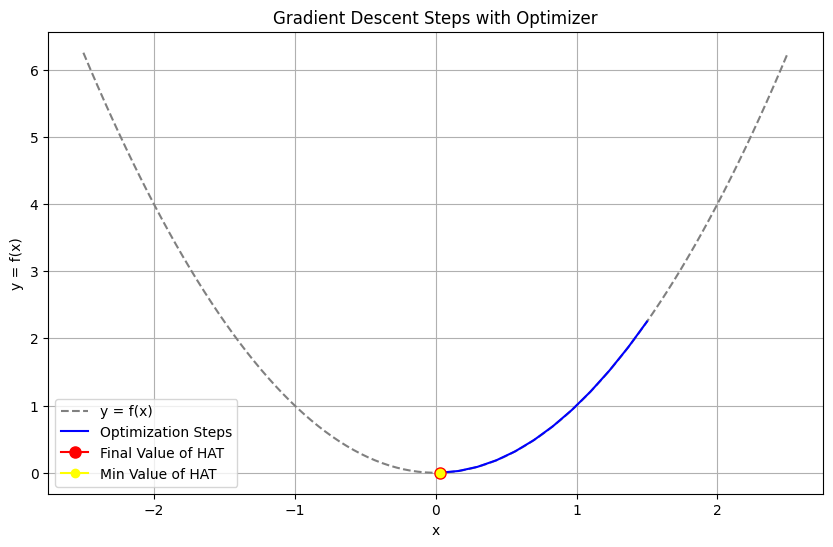

In [26]:

x_curve = np.linspace(-2.5, 2.5, 100)  # Define the range for x
y_curve = f(x_curve)   # Calculate y values for the function

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(x_curve, y_curve, label="y = f(x)", color='gray', linestyle='--')  # Plot the function
plt.plot(x_values, y_values, color='b', label="Optimization Steps")  # Plot the optimization steps

# Mark the final value with a red dot
plt.plot(x_values[-1], y_values[-1], marker='o', color='red', markersize=8, label="Final Value of HAT")
plt.plot(x_values[np.argmin(y_values)], y_values[np.argmin(y_values)] , marker='o', color='yellow', markersize=6, label="Min Value of HAT")

plt.xlabel("x")
plt.ylabel("y = f(x)")
plt.title("Gradient Descent Steps with Optimizer")
plt.legend()
plt.grid(True)
plt.show()

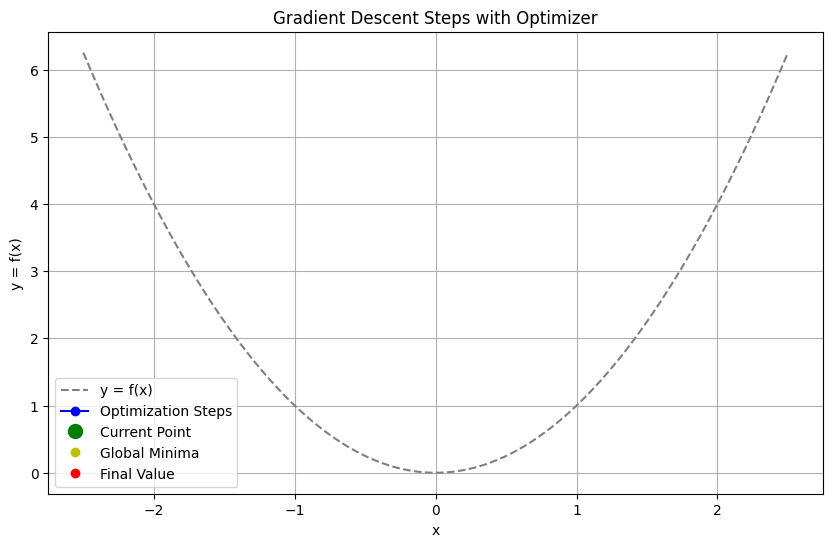

In [27]:

# Initialize the plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(x_curve, y_curve, label="y = f(x)", color='gray', linestyle='--')
ax.set_xlabel("x")
ax.set_ylabel("y = f(x)")
ax.set_title("Gradient Descent Steps with Optimizer")
ax.grid(True)

# # Initialize the line for the optimization steps
line, = ax.plot([], [], color='b', marker='o', label="Optimization Steps")
# final_point, = ax.plot([], [], 'ro', markersize=8, label="Final Value of HAT")
# min_point, = ax.plot([], [], 'yo', markersize=6, label="Min Value of HAT")

# Initialize plots for each color category
past_points, = ax.plot([], [], 'bo', label="_nolegend_")  # Blue for past points
current_point, = ax.plot([], [], 'go', label="Current Point", markersize = 10)  # Green for current point
min_point, = ax.plot([], [], 'yo', label="Global Minima")  # Yellow for minimum point
final_point, = ax.plot([], [], 'ro', label="Final Value")  # Red for final point

# Function to initialize the animation
def init():
    line.set_data([], [])
    current_point.set_data([], [])
    min_point.set_data([], [])
    final_point.set_data([], [])
    return line, current_point, min_point, final_point

# Animation function to update the plot in each frame
def animate(i):
    # Update the line with all points up to the current point
    line.set_data(x_values[:i+1], y_values[:i+1])
    
    # Update the green point for the current point
    current_point.set_data([x_values[i]], [y_values[i]])
    
    # Set the yellow point for the minimum point if the current frame has passed it
    min_index = np.argmin(y_values)
    if i >= min_index:
        min_point.set_data([x_values[min_index]], [y_values[min_index]])
    
    # Set the red point for the final point in the last frame
    if i == len(x_values) - 1:
        final_point.set_data([x_values[-1]], [y_values[-1]])
    
    return line, current_point, min_point, final_point

# Create the animation
ani = FuncAnimation(fig, animate, frames=len(x_values), init_func=init, interval=500, blit=True)

# Show the plot
plt.legend()
plt.show()


from IPython.display import HTML
HTML(ani.to_jshtml())

In [28]:
x_values[np.argmin(y_values)], x_values[-1]

(0.028435131534934044, 0.028435131534934044)

In [29]:

# ani.save('data/gradient_descent_animation.gif', writer='pillow', fps=2)

Conclusion : The hardware aware optimizer is actually getting to the minima properly, but when the gradient is very small, still it is shaking up the weights. Which we don't want!

In [30]:
# import numpy as np
# import matplotlib.pyplot as plt
# from matplotlib.animation import FuncAnimation

# # Define the function to plot
# def f(x):
#     return (x - 3) ** 2 + 1  # Example function

# # Define the range for x and calculate y values for the function
# x_curve = np.linspace(-4, 7, 100)
# y_curve = f(x_curve)

# # Example optimization steps
# x_values = np.linspace(-3, 5, 10)  # Replace with actual optimization x values
# y_values = f(x_values)  # Calculate y values for each step

# # Initialize the plot
# fig, ax = plt.subplots(figsize=(10, 6))
# ax.plot(x_curve, y_curve, label="y = f(x)", color='gray', linestyle='--')
# ax.set_xlabel("x")
# ax.set_ylabel("y = f(x)")
# ax.set_title("Gradient Descent Steps with Optimizer")
# ax.grid(True)

# # Initialize the line for the optimization steps
# line, = ax.plot([], [], color='b', marker='o', label="Optimization Steps")
# final_point, = ax.plot([], [], 'ro', markersize=8, label="Final Value of HAT")
# min_point, = ax.plot([], [], 'yo', markersize=6, label="Min Value of HAT")

# # Function to initialize the animation
# def init():
#     line.set_data([], [])
#     final_point.set_data([], [])
#     min_point.set_data([], [])
#     return line, final_point, min_point

# # Animation function to update the plot in each frame
# def animate(i):
#     # Update the line with current optimization steps up to index i
#     line.set_data(x_values[:i+1], y_values[:i+1])  
#     # Mark the final point in red
#     if i == len(x_values) - 1:
#         final_point.set_data([x_values[-1]], [y_values[-1]])  # Provide as lists
#         # Mark the minimum point in yellow
#         min_index = np.argmin(y_values)
#         min_point.set_data([x_values[min_index]], [y_values[min_index]])  # Provide as lists
#     return line, final_point, min_point

# # Create the animation
# ani = FuncAnimation(fig, animate, frames=len(x_values), init_func=init, interval=500, blit=True)


